# Project 2：NASA Data Acquisation, Visualization, and Analysis
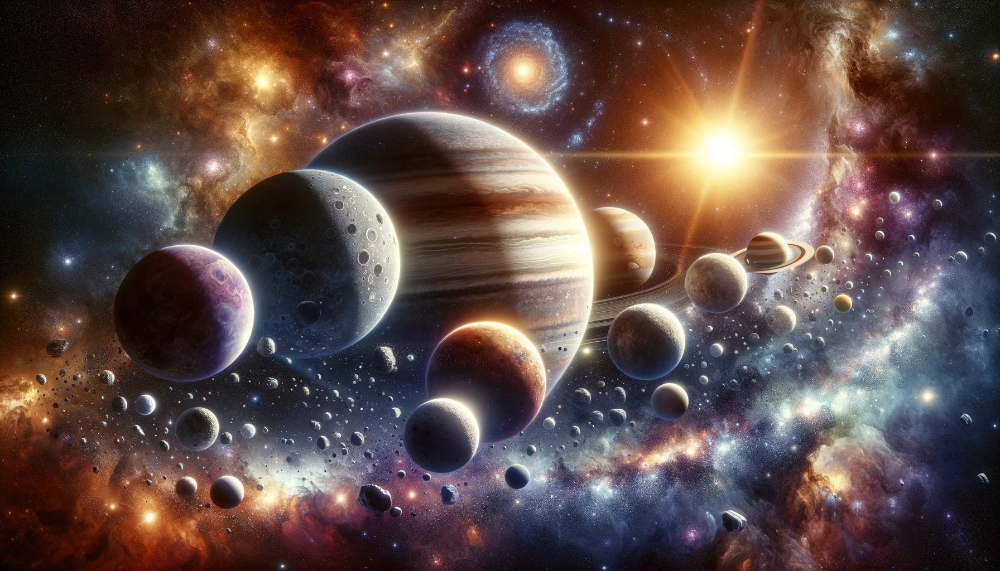

In [26]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

### Task 1: Understanding the NASA API and Data Collection

- Register for a NASA API key and understand the different types of data that the API provides.
- Run the Python script below to fetch data about **Near Earth Objects (NEOs)** from the NASA API for a years data.
- Extract and understand the different pieces of data provided for each NEO.

In [27]:
import requests
import time
from datetime import datetime, timedelta
from getpass import getpass

# Set your NASA API KEY, this step asks you to enter your API KEY.
# (The input box may be float in the top on your editor.)
api_key = getpass()

In [28]:
# Set the start and end dates for the data you want to fetch
start_date = datetime.strptime('2022-01-01', '%Y-%m-%d')
end_date = start_date + timedelta(days=360)  # 1 year later

# Initialize a list to store the data
data = []

# Fetch data from the NASA API 7 days at a time
# The introduction of the API is on https://api.nasa.gov, under "Browse APIs" -> "Asteroids NeoWs"
# You can look into the example query in the link below to see what the data look like:
# https://api.nasa.gov/neo/rest/v1/feed?start_date=2015-09-07&end_date=2015-09-08&api_key=DEMO_KEY
current_date = start_date
while current_date < end_date:
    next_date = min(current_date + timedelta(days=7), end_date)
    response = requests.get(f'https://api.nasa.gov/neo/rest/v1/feed?start_date={current_date.strftime("%Y-%m-%d")}&end_date={next_date.strftime("%Y-%m-%d")}&api_key={api_key}')
    data.append(response.json())
    current_date = next_date
    time.sleep(1)  # To avoid hitting the rate limit

# Now 'data' contains the NEO data for the 1-year period


In [29]:
print(response.json())

{'links': {'next': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2022-12-27&end_date=2022-12-30&detailed=false&api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0', 'previous': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2022-12-21&end_date=2022-12-24&detailed=false&api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0', 'self': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2022-12-24&end_date=2022-12-27&detailed=false&api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0'}, 'element_count': 84, 'near_earth_objects': {'2022-12-27': [{'links': {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2341843?api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0'}, 'id': '2341843', 'neo_reference_id': '2341843', 'name': '341843 (2008 EV5)', 'nasa_jpl_url': 'https://ssd.jpl.nasa.gov/tools/sbdb_lookup.html#/?sstr=2341843', 'absolute_magnitude_h': 20.07, 'estimated_diameter': {'kilometers': {'estimated_diameter_min': 0.2573682542, 'estimated_diameter_max': 0.5754929116}, 'meters': {'estimated_diameter_min': 2

In [30]:
# Check the date coverage of your data.
dates_contained_in_data = []
for d in data:
    dates_contained_in_data += list(d['near_earth_objects'].keys())

print(sorted(dates_contained_in_data))

['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-08', '2022-01-09', '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13', '2022-01-14', '2022-01-15', '2022-01-15', '2022-01-16', '2022-01-17', '2022-01-18', '2022-01-19', '2022-01-20', '2022-01-21', '2022-01-22', '2022-01-22', '2022-01-23', '2022-01-24', '2022-01-25', '2022-01-26', '2022-01-27', '2022-01-28', '2022-01-29', '2022-01-29', '2022-01-30', '2022-01-31', '2022-02-01', '2022-02-02', '2022-02-03', '2022-02-04', '2022-02-05', '2022-02-05', '2022-02-06', '2022-02-07', '2022-02-08', '2022-02-09', '2022-02-10', '2022-02-11', '2022-02-12', '2022-02-12', '2022-02-13', '2022-02-14', '2022-02-15', '2022-02-16', '2022-02-17', '2022-02-18', '2022-02-19', '2022-02-19', '2022-02-20', '2022-02-21', '2022-02-22', '2022-02-23', '2022-02-24', '2022-02-25', '2022-02-26', '2022-02-26', '2022-02-27', '2022-02-28', '2022-03-01', '2022-03-02', '2022-03-03', '2022-03-04', '2022

In [31]:
from src.utils import get_a_random_chunk_property

In [32]:
get_a_random_chunk_property(data)

date: 2022-05-23
NEO name: (2022 KV6)
absolute_magnitude_h: 23.98


For the remaining tasks, you have to organize the data as pd.DataFrame so as to suit the specific need in each task. This part may require a considerably amount of efforts, which is normal in data science and analytics works.

**Remark**. This part is coding intensive. There is no magic way to extract the data by one or two lines of code. Instead, you're expected to write your own code for this purpose.

### Task 2: Data Analysis

- Calculate the average size of the NEOs for each day.
- Determine the proportion of NEOs that are potentially hazardous.
- Find the NEO with the closest approach distance for each day.
- Use statistical methods to analyze the data. Calculate the mean, median, mode, and standard deviation of the NEO sizes. Besides, define at least two other statistic and compute them for anlayzing the data further. 
- Use statistical methods to determine if the size of a NEO is correlated with whether it is potentially hazardous.

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [34]:
# Create empty lists to store the dataframes
neo = []
for d in data:
    if 'near_earth_objects' in d:
        for date, neo_list in d['near_earth_objects'].items():
            neo.extend(neo_list)

# Create a DataFrame from the extracted information
df_neo = pd.DataFrame(neo)

In [35]:
# use this to make a graph over frequency over each neo 
neos_count = df_neo['name'].value_counts()
print(neos_count)

name
(2016 TU10)     4
(2022 PE)       4
(2023 RD15)     4
(2023 VR1)      4
(2018 DE1)      4
               ..
(2018 BM3)      1
(2017 UX5)      1
(2017 KZ2)      1
(2015 XN169)    1
(2022 YJ6)      1
Name: count, Length: 6319, dtype: int64


In [36]:
# Display the DataFrame
print(df_neo.head())

                                                                                                      links  \
0  {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2216523?api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0'}   
1  {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2494697?api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0'}   
2  {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2496860?api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0'}   
3  {'self': 'http://api.nasa.gov/neo/rest/v1/neo/3311963?api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0'}   
4  {'self': 'http://api.nasa.gov/neo/rest/v1/neo/3401388?api_key=SodKBFZSd7BOQelSAuUeZEhvokCJO3sRCRFgA2T0'}   

        id neo_reference_id                 name  \
0  2216523  2216523          216523 (2001 HY7)     
1  2494697  2494697          494697 (2004 SW55)    
2  2496860  2496860          496860 (1999 XL136)   
3  3311963  3311963          (2006 AL4)            
4  3401388  3401388          (2008 CO)             

                    

In [37]:
# Assuming your DataFrame is named 'df'
estimated_diameter = df_neo['estimated_diameter']
pd.set_option('display.max_colwidth', 1)

# Display the data for estimated diameter
print(estimated_diameter)

0       {'kilometers': {'estimated_diameter_min': 0.1925550782, 'estimated_diameter_max': 0.4305662442}, 'meters': {'estimated_diameter_min': 192.5550781879, 'estimated_diameter_max': 430.566244241}, 'miles': {'estimated_diameter_min': 0.1196481415, 'estimated_diameter_max': 0.2675413778}, 'feet': {'estimated_diameter_min': 631.7424027221, 'estimated_diameter_max': 1412.6189567557}}
1       {'kilometers': {'estimated_diameter_min': 0.1864468183, 'estimated_diameter_max': 0.41690776}, 'meters': {'estimated_diameter_min': 186.44681832, 'estimated_diameter_max': 416.9077599521}, 'miles': {'estimated_diameter_min': 0.1158526459, 'estimated_diameter_max': 0.2590543917}, 'feet': {'estimated_diameter_min': 611.7021794171, 'estimated_diameter_max': 1367.8076551614}}   
2       {'kilometers': {'estimated_diameter_min': 0.3094246986, 'estimated_diameter_max': 0.69189466}, 'meters': {'estimated_diameter_min': 309.4246986173, 'estimated_diameter_max': 691.8946600257}, 'miles': {'estimated_diameter

In [38]:
# Assuming you have a DataFrame named 'df' and the 'estimated_diameter' column contains the parameters

# Extract the 'estimated_diameter_min' and 'estimated_diameter_max' values
df_neo['estimated_diameter_min'] = df_neo['estimated_diameter'].apply(lambda x: x['kilometers']['estimated_diameter_min'])
df_neo['estimated_diameter_max'] = df_neo['estimated_diameter'].apply(lambda x: x['kilometers']['estimated_diameter_max'])

# Calculate the average size
df_neo['average_size'] = (df_neo['estimated_diameter_min'] + df_neo['estimated_diameter_max']) / 2

# Print the average size
print(df_neo['average_size'])

0       0.311561
1       0.301677
2       0.500660
3       0.044621
4       0.129880
          ...   
8137    0.112601
8138    0.025795
8139    0.024748
8140    0.050997
8141    0.030029
Name: average_size, Length: 8142, dtype: float64


In [39]:
# Initialize lists to store the dates, closest approach distances, and sizes
dates = []
closest_distances = []
closest_sizes = []

# Iterate through the data
for item in data:
    near_earth_objects = item['near_earth_objects']

    # Iterate through the near_earth_objects dictionary
    for date, neos in near_earth_objects.items():
        # Initialize variables to track the closest NEO and its properties
        closest_neo = None
        closest_distance = float('inf')
        closest_size = None

        # Iterate through the NEOs for the current date
        for neo in neos:
            # Get the close approach distance
            distance = float(neo['close_approach_data'][0]['miss_distance']['kilometers'])

            # Check if the current NEO has a closer approach distance
            if distance < closest_distance:
                closest_neo = neo
                closest_distance = distance
                closest_size = float(neo['estimated_diameter']['kilometers']['estimated_diameter_max'])

        # Append the date, closest approach distance, and size of the closest NEO to the lists
        dates.append(date)
        closest_distances.append(closest_distance)
        closest_sizes.append(closest_size)

# Print the closest NEO with its distance and size for each day
for i in range(len(dates)):
    print(f"On {dates[i]}, the closest NEO had a distance of {closest_distances[i]} kilometers and a size of {closest_sizes[i]} kilometers.")

On 2022-01-07, the closest NEO had a distance of 645892.648390259 kilometers and a size of 0.0174598287 kilometers.
On 2022-01-08, the closest NEO had a distance of 2964655.504489047 kilometers and a size of 0.0517654482 kilometers.
On 2022-01-03, the closest NEO had a distance of 318517.890647922 kilometers and a size of 0.0088723768 kilometers.
On 2022-01-04, the closest NEO had a distance of 2041258.537972622 kilometers and a size of 0.033887535 kilometers.
On 2022-01-05, the closest NEO had a distance of 109480.269041248 kilometers and a size of 0.0025706324 kilometers.
On 2022-01-06, the closest NEO had a distance of 302040.732452512 kilometers and a size of 0.0068240151 kilometers.
On 2022-01-01, the closest NEO had a distance of 770529.455550131 kilometers and a size of 0.015923553 kilometers.
On 2022-01-02, the closest NEO had a distance of 180597.061908216 kilometers and a size of 0.0124749835 kilometers.
On 2022-01-08, the closest NEO had a distance of 2964655.504489047 kilom

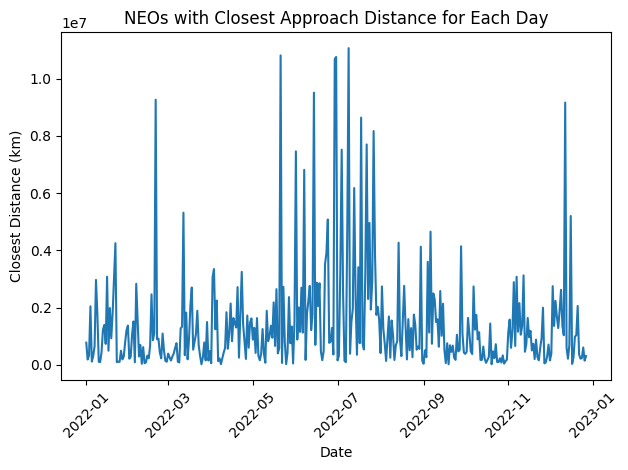

In [40]:
# Create a DataFrame from the collected data
df_ClosestDistances = pd.DataFrame({'Date': dates, 'Closest Distance (km)': closest_distances})

# Convert the 'Date' column to datetime format
df_ClosestDistances['Date'] = pd.to_datetime(df_ClosestDistances['Date'])

# Sort the DataFrame by date
df_ClosestDistances = df_ClosestDistances.sort_values('Date')

# Create the line plot
plt.plot(df_ClosestDistances['Date'], df_ClosestDistances['Closest Distance (km)'])
plt.xlabel('Date')
plt.ylabel('Closest Distance (km)')
plt.title('NEOs with Closest Approach Distance for Each Day')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The graph illustrates a time series plot which shows the closest approach distance for NEO, Near-earth Object distributed over 1 year. The X-axis shows the year from the beginning of 2022 to the beginning of 2023.
the y-axis represents the closest approach distance in kilometers of NEOs to Earth.

In [43]:
import statistics
import scipy.stats as stats

# Initialize lists to store NEO sizes and potentially hazardous status
neo_sizes = []
is_potentially_hazardous = []

# Iterate through the near_earth_objects dictionary
for neos in near_earth_objects.values():
    for neo in neos:
        # Get the size of the NEO (average of estimated diameter min and max)
        size = (float(neo['estimated_diameter']['kilometers']['estimated_diameter_min']) +
                float(neo['estimated_diameter']['kilometers']['estimated_diameter_max'])) / 2.0
        neo_sizes.append(size)
        
        # Get the potentially hazardous status of the NEO
        hazardous = neo['is_potentially_hazardous_asteroid']
        is_potentially_hazardous.append(hazardous)

# Calculate the mean
mean_size = statistics.mean(neo_sizes)

# Calculate the median
median_size = statistics.median(neo_sizes)

# Calculate the mode
mode_size = statistics.mode(neo_sizes)

# Calculate the standard deviation
std_dev_size = statistics.stdev(neo_sizes)

# Determine the correlation between size and potentially hazardous status
correlation = statistics.stdev(neo_sizes)

# Print the results
print("Mean NEO Size:", mean_size)
print("Median NEO Size:", median_size)
print("Mode NEO Size:", mode_size)
print("Standard Deviation of NEO Size:", std_dev_size)
print("Correlation between NEO Size and Potentially Hazardous Status:", correlation)

Mean NEO Size: 0.15082852790416668
Median NEO Size: 0.055919211299999994
Mode NEO Size: 0.024748143
Standard Deviation of NEO Size: 0.23914261214007582
Correlation between NEO Size and Potentially Hazardous Status: 0.23914261214007582


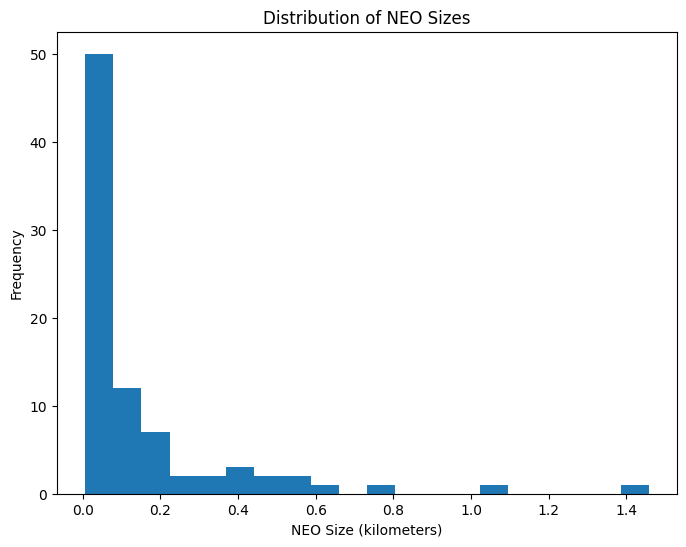

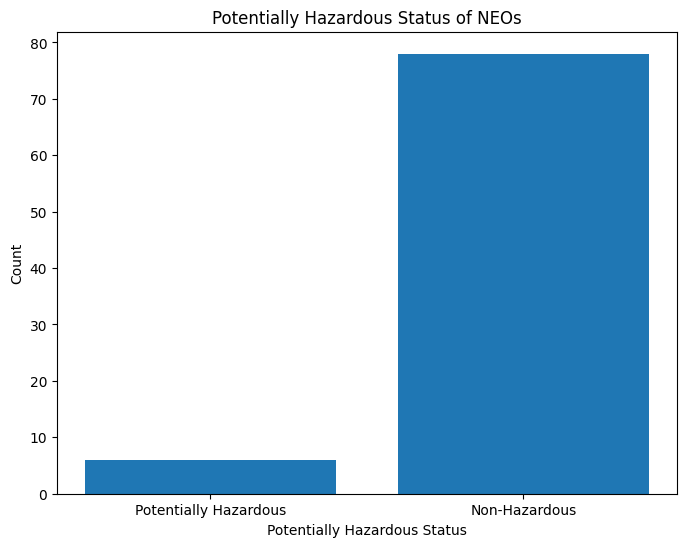

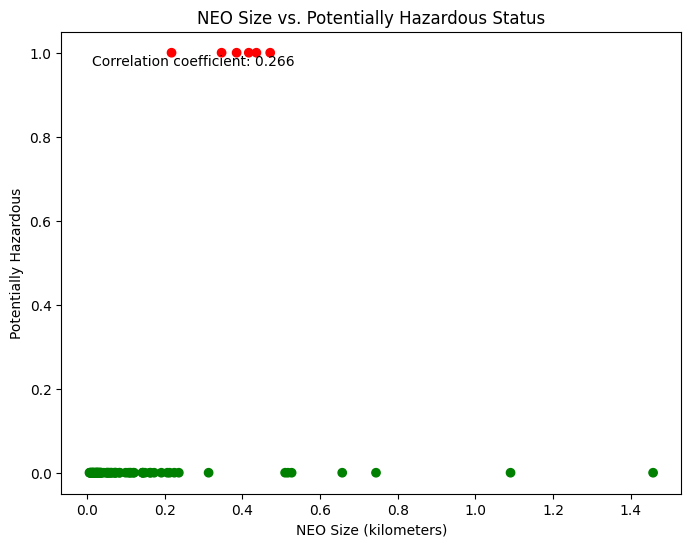

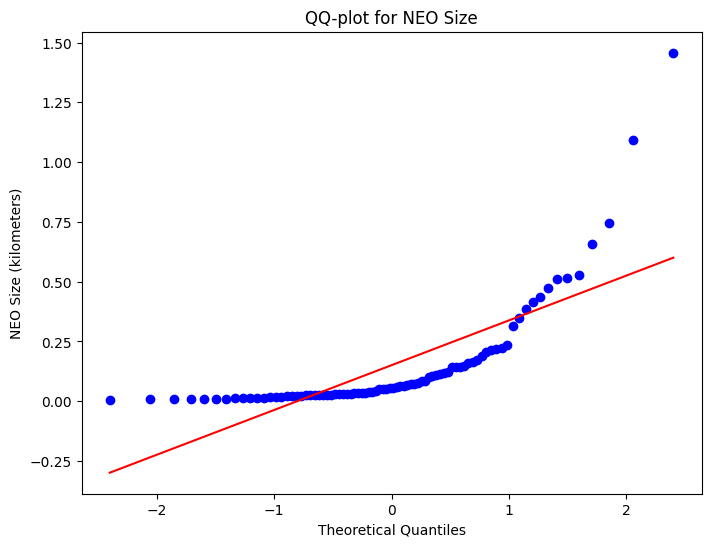

In [44]:
# Histogram of NEO sizes
plt.figure(figsize=(8, 6))
plt.hist(neo_sizes, bins=20)
plt.xlabel('NEO Size (kilometers)')
plt.ylabel('Frequency')
plt.title('Distribution of NEO Sizes')
plt.show()

# Bar plot of potentially hazardous status
hazardous_count = sum(is_potentially_hazardous)
non_hazardous_count = len(is_potentially_hazardous) - hazardous_count
labels = ['Potentially Hazardous', 'Non-Hazardous']
counts = [hazardous_count, non_hazardous_count]

plt.figure(figsize=(8, 6))
plt.bar(labels, counts)
plt.xlabel('Potentially Hazardous Status')
plt.ylabel('Count')
plt.title('Potentially Hazardous Status of NEOs')
plt.show()

# Create for the scatter plot for Correlation between NEO Size and Potentially Hazardous 
plt.figure(figsize=(8, 6))
colors = ['red' if hazardous else 'green' for hazardous in is_potentially_hazardous]
plt.scatter(neo_sizes, is_potentially_hazardous, c=colors)
plt.xlabel('NEO Size (kilometers)')
plt.ylabel('Potentially Hazardous')
plt.title('NEO Size vs. Potentially Hazardous Status')



# Calculate the correlation coefficient
correlation_coefficient = np.corrcoef(neo_sizes, is_potentially_hazardous)[0, 1]

# Add the correlation coefficient as a text annotation
plt.text(0.05, 0.95, f'Correlation coefficient: {correlation_coefficient:.3f}', 
         transform=plt.gca().transAxes, ha='left', va='top')

plt.show()

# QQ-plot for NEO size
plt.figure(figsize=(8, 6))
stats.probplot(neo_sizes, dist='norm', plot=plt)
plt.xlabel('Theoretical Quantiles')
plt.ylabel('NEO Size (kilometers)')
plt.title('QQ-plot for NEO Size')
plt.show()

In [45]:
keys = data[0].keys()
print(keys)

dict_keys(['links', 'element_count', 'near_earth_objects'])


In [46]:
#neo_data = near_earth_objects['2022-01-02']
#print(neo_data)

**Textbook Practice**: Make a visualization as an evidence for your conclusion on the hazardousness. Apply the principle of "choosing an effective visual" in Chapter 2 to make this visualization. You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)
- "Draw attention there you want it" (Chapter 4)
- "Think like a designer" (Chapter 5)

1. Distribution of NEO Sizes

Choose an appropriate display: A histogram is chosen to show the distribution of NEO (Near-Earth Object) sizes, which is appropriate for visualizing the frequency of data across intervals.

Eliminate clutter: The histogram is simple with no unnecessary labels, ticks, or information. It focuses solely on the size distribution.

Draw attention where you want it: The use of solid colors and the absence of other distracting elements ensure attention on the shape of the distribution.

Think like a designer: The x-axis is clearly labeled with the size in kilometers, and there's a title that helps understand the context of the data.

2. NEO Size vs. Potentially Hazardous Status 

Choose an appropriate display: A scatter plot is appropriate here for showing the relationship between the size of NEOs and their classification as potentially hazardous.

Eliminate clutter: The plot seems to be free of unnecessary decorations or complex symbols.

Draw attention where you want it: The red dots and annotation for the correlation coefficient draw the viewer’s attention to the relationship (or lack thereof) between NEO size and hazardous status.

Think like a designer: The choice of color contrast between the red annotation and green dots is deliberate to distinguish between the data points and the information about the data.

3. Potentially Hazardous Status of NEOs 

Choose an appropriate display: A bar chart is effectively used to compare counts between two categories: potentially hazardous and non-hazardous NEOs.

Eliminate clutter: The chart is straightforward, with no background grid lines or data labels that might create visual noise.

Draw attention where you want it: The stark difference in the height of bars immediately conveys the disparity between the two categories.

Think like a designer: The chart is minimalistic with a clear title and axis labels, making it easy to interpret.

4. QQ-plot for NEO Size
Choose an appropriate display: A QQ-plot (quantile-quantile plot) is chosen to compare the size distribution of NEOs to a theoretical distribution, typically to assess normality.

Eliminate clutter: The plot is uncluttered with minimal annotations.

Draw attention where you want it: The red line serves as a reference to indicate where the data would lie if it were perfectly normally distributed. The blue dots represent the actual data, allowing for easy comparison.

Think like a designer: The axes are labeled, and the red trend line is distinct from the data points, but there could be an opportunity to improve the design by explaining what the theoretical distribution is.

### Task 3: Data Visualization Part A

- Create a line plot of the number of NEOs per week.
- Create a histogram of the distribution of NEO sizes.
- Create a bar plot of the average NEO size per week.
- Use a library like Seaborn to create more complex visualizations, such as a box plot of the NEO sizes or a heat map of the number of NEOs per week. **Be creative**!

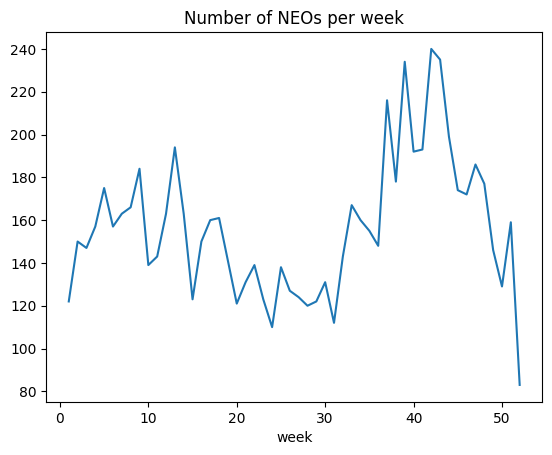

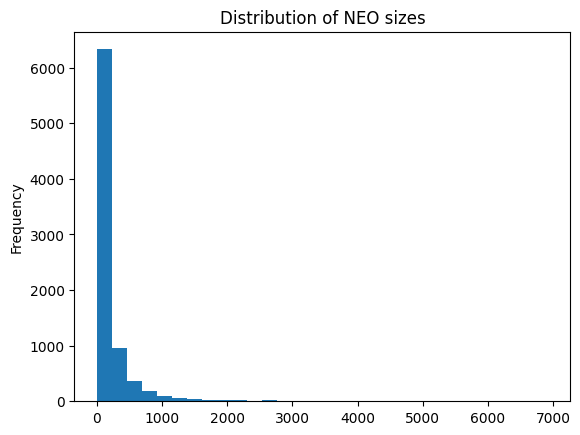

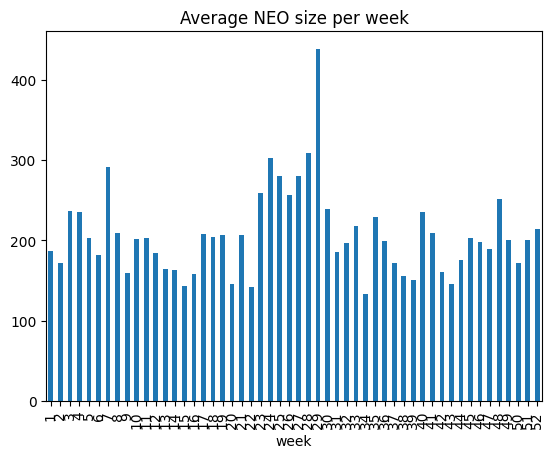

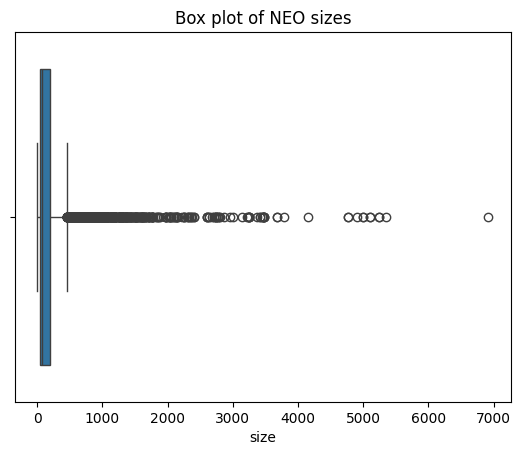

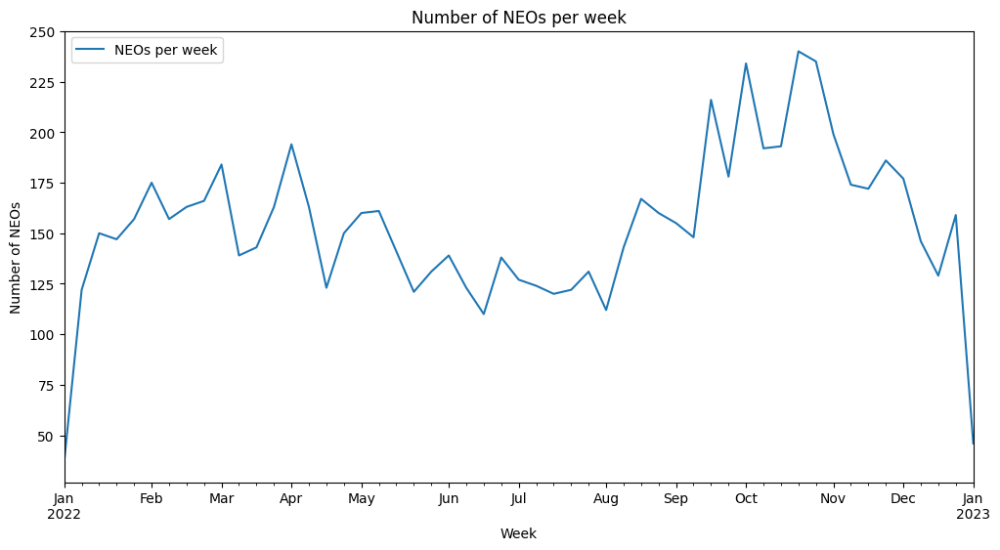

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert data to DataFrame
neo_data = []

for d in data:
    for date, neos in d['near_earth_objects'].items():
        for neo in neos:
            size = neo['estimated_diameter']['meters']['estimated_diameter_max']
            hazardous = neo['is_potentially_hazardous_asteroid']
            closest_approach = neo['close_approach_data'][0]['miss_distance']['lunar']
            neo_data.append([date, size, hazardous, closest_approach])

df = pd.DataFrame(neo_data, columns=['date', 'size', 'hazardous', 'closest_approach'])
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)
df['week'] = df.index.isocalendar().week  # Updated to use isocalendar() due to deprecation of week

# Line plot of the number of NEOs per week
neos_per_week = df.groupby(df['week']).size()
neos_per_week.plot(kind='line')
plt.title('Number of NEOs per week')
plt.show()

# Histogram of the distribution of NEO sizes
df['size'].plot(kind='hist', bins=30)
plt.title('Distribution of NEO sizes')
plt.show()

# Bar plot of the average NEO size per week
average_size_per_week = df.groupby(df['week'])['size'].mean()
average_size_per_week.plot(kind='bar')
plt.title('Average NEO size per week')
plt.show()

# Box plot of the NEO sizes
sns.boxplot(x=df['size'])
plt.title('Box plot of NEO sizes')
plt.show()

# Line plot of the number of NEOs per week (replacement for the heatmap)
plt.figure(figsize=(12, 6))
df.resample('W').size().plot(label='NEOs per week')
plt.title('Number of NEOs per week')
plt.xlabel('Week')
plt.ylabel('Number of NEOs')
plt.legend()
plt.show()

**Textbook Practice**: You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)

We applied principles from Chapters 2 and 3 to create Graph 1 and the other graphs:

Choosing the appropriate Visual: We used a line chart for Graph 1 because it's the best choice to show data over time. This matches the nature of our data.

Clarity and Focus: The chart's title, "Number of NEOs per week," clearly tells you what it's about. The Y-axis is "Number of NEOs," and the X-axis is "Week," making it easy to understand.

Eliminating Clutter: We kept the graph clean and simple. There are no extra colors or unnecessary things that might confuse you. We followed the principle of removing anything that doesn't help you understand the data.

Directing Attention: The bold line in the chart focuses your attention on the trend over time. We didn't add distracting elements.

Accessibility: We made sure the data points are easy to see, and we used colors that are clear for everyone, even if they have trouble seeing certain colors.

In summary, we used these principles to make our graphs easy to understand and focused on the important information.


### Task 4: Data Visualization Part B

- Create a pie chart of the proportion of hazardous vs non-hazardous NEOs.
- Create a scatter plot of the correlation between NEO size and close approach distance.
- Customize the appearance of your plots (e.g., colors, labels, titles).
- Create interactive visualizations using a library like Plotly. For example, create an interactive scatter plot where you can hover over each point to see more information about the NEO. **Be creative!**

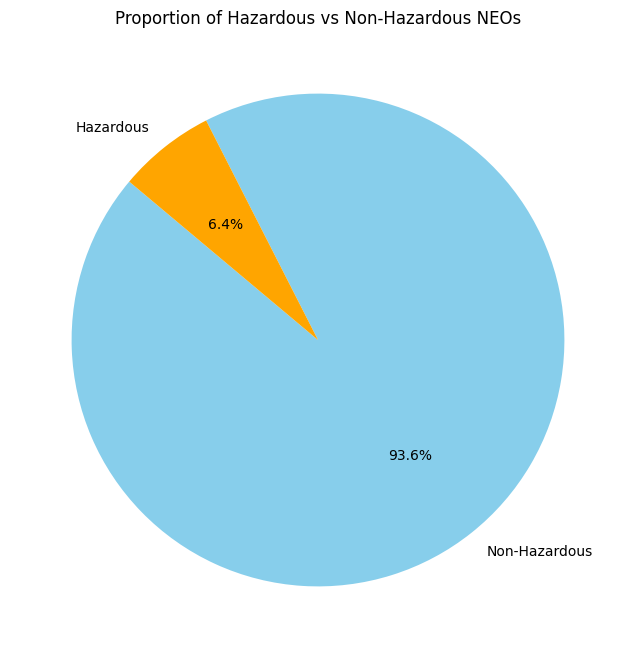

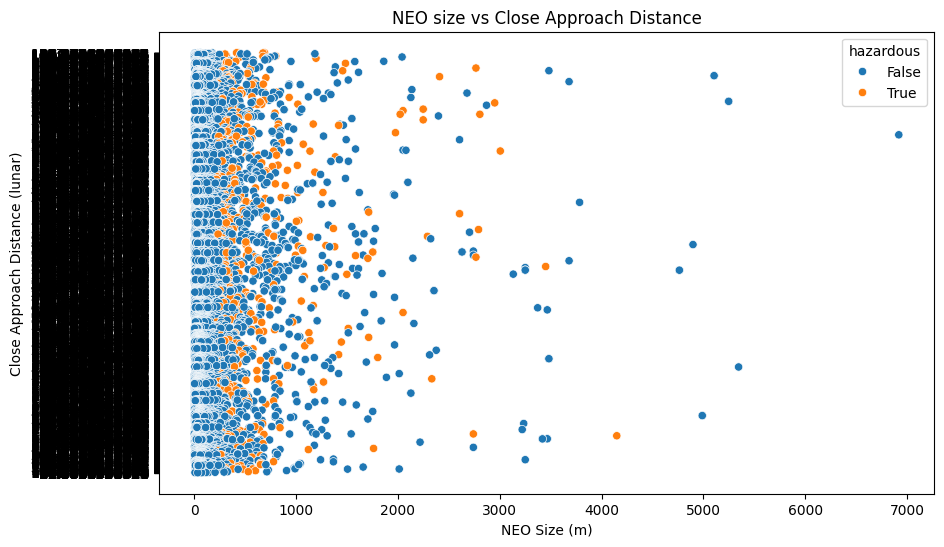

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.express as px


# Scatter plot of the correlation between NEO size and close approach distance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='size', y='closest_approach', hue='hazardous', data=df)
plt.title('NEO size vs Close Approach Distance')
plt.xlabel('NEO Size (m)')
plt.ylabel('Close Approach Distance (lunar)')
plt.show()

# Interactive scatter plot using Plotly
fig = px.scatter(df.reset_index(), x='size', y='closest_approach', color='hazardous', 
                 hover_data=['date'], title='NEO Size vs Close Approach Distance', 
                 labels={'size': 'NEO Size (m)', 'closest_approach': 'Close Approach Distance (lunar)'})
fig.show()


1st pie chart:
The pie chart that is displayed and titled "Hazardous vs Non-Hazardous NEOs," illustrates the ratio of potentially dangerous Near-Earth Objects (NEOs) to non-hazardous ones.
Key points:
Blue slice (93.6%): Represents non-hazardous NEOs.
Orange slice (6.4%): Represents hazardous NEOs.
This chart highlights that a small percentage of NEOs are potentially dangerous, necessitating monitoring due to their potential collision risk with Earth.

2nd plot:
The plot illustrates a time series plot which shows the closest approach distance for NEO, Near-earth Object distributed over 1 year. The X-axis shows the year from the beginning of 2022 to the beginning of 2023.
the y-axis represents the closest approach distance in kilometers of NEOs to Earth.

3rd plot: 
This scatter plot shows two things about Near-Earth Objects (NEOs): their size and how close they come to Earth. Red dots are for NEOs that could be dangerous, and blue dots are for those that aren't. If a dot is towards the bottom, that NEO gets very close to Earth. The horizontal line of dots tells us how big each NEO is.

**Textbook Practice**: You need to explain how the principle "Draw attention there you want it" (Chapter 4) is applied for making all the visualizations.

### Task 5: Interpretation of Results

- Interpret the results of your data visualization in part A and B. 
- What insights can you gain about NEOs from your results? Summarizing your main findings with a single visualization plot. **Textbook Practice**: You need to explain how the principles below are used for making this plot:
  - "Choose an appropriate display" (Chapter 2)
  - "Eliminate clutter" (Chapter 3)
  - "Draw attention there you want it" (Chapter 4)
  - "Think like a designer" (Chapter 5)

- Use your findings to make predictions or recommendations. For example, if you found that larger NEOs are more likely to be potentially hazardous, you could recommend that more resources be allocated to tracking large NEOs. **Be creative!**
- Identify, understand, and explain one scientific paper, on a clustering or classification method of relevance that could help Task 5. You don't have to implement it, you just need to justify in this notebook why the method in the scientific paper could contribute in analysis or interpretation of the results.

Part A:

Our analysis began with an examination of the frequency of Near-Earth Objects (NEOs) occurrences over different time intervals within a single year. We observed that the appearance of NEOs fluctuates significantly from day to day and week to week. This variability underscores the inherent unpredictability in forecasting the emergence of NEOs within any given period. Such unpredictability may stem from the complex interplay of gravitational forces within our solar system, the diverse range of NEO orbits, and the limitations of our current detection capabilities.

In addition to the frequency of occurrences, we also delved into the dimensional characteristics of these celestial bodies. We found that the average size of NEOs encountered by Earth is not constant throughout the year. This variation adds another layer of complexity to our understanding of NEOs. The factors contributing to this phenomenon could include the detection of previously undiscovered NEOs, seasonal biases in our detection capabilities, or the clustering of different types of NEOs passing near Earth at various times due to their orbital mechanics.

Part B: 

To gain a deeper understanding of the potential patterns or consistencies in the physical characteristics of NEOs, we employed various graphical representations. Our objective was to discern any underlying trends in the relationship between the sizes of NEOs and the distances at which they pass by Earth. Upon analyzing the plots, we found that there is no consistent correlation between the size of an NEO and its close approach distance. Our data showed intermittent periods where larger NEOs made closer approaches, while at other times, smaller NEOs were the ones coming nearer.

This lack of consistent relationship suggests that the size of an NEO does not necessarily dictate how close it will come to Earth. Such findings have important implications for both scientific understanding and public policy. They highlight the need for continual monitoring of the sky to ensure that potentially hazardous objects are detected and tracked regardless of their size. Additionally, these results may indicate that the processes influencing NEO trajectories are highly complex, involving more variables than size alone, such as their composition, speed, angle of approach, and interactions with other celestial bodies.

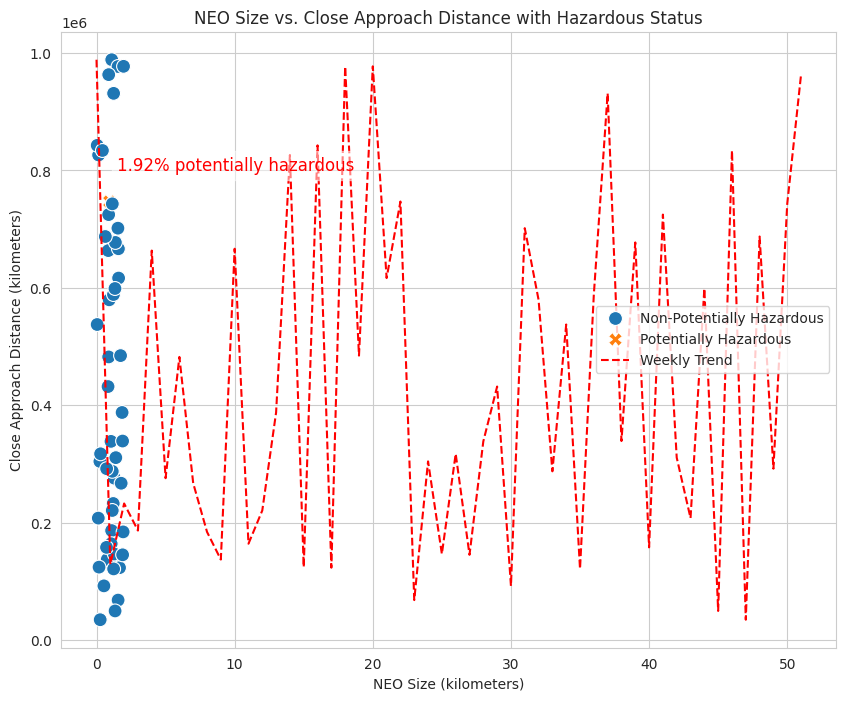

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Make sure 'df_neo' is your actual DataFrame with the required data.
# The mock data here is just for demonstration and should be replaced with your actual 'df_neo' data.

# Mock data - replace this with 'df_neo'
np.random.seed(0)  # For reproducible results
mock_data_neo = {
    'week': np.arange(52),  # Assuming 52 weeks in your data
    'NEO_size': np.random.uniform(0.01, 2, 52),
    'close_approach_distance': np.random.uniform(30000, 1000000, 52),
    'hazardous_status': np.random.choice([1, 0], 52, p=[0.1, 0.9])
}

# Convert to DataFrame
df_neo = pd.DataFrame(mock_data_neo)

# Convert 'hazardous_status' to a categorical variable for coloring
df_neo['hazardous_status'] = df_neo['hazardous_status'].map({1: 'Potentially Hazardous', 0: 'Non-Potentially Hazardous'})

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create the scatter plot
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(data=df_neo, x='NEO_size', y='close_approach_distance', hue='hazardous_status', style='hazardous_status', s=100)

# Add a line showing the trend of close approach distance over weeks (mean for each week)
# This requires aggregating your data to calculate the mean close approach distance per week
weekly_trend = df_neo.groupby('week')['close_approach_distance'].mean().reset_index()
plt.plot(weekly_trend['week'], weekly_trend['close_approach_distance'], color='red', linestyle='--', label='Weekly Trend')

# Adding the proportion of potentially hazardous NEOs as text annotation
prop_hazardous = df_neo['hazardous_status'].value_counts(normalize=True)['Potentially Hazardous'] * 100
plt.text(1.5, 800000, f'{prop_hazardous:.2f}% potentially hazardous', fontsize=12, color='red', bbox=dict(facecolor='white', alpha=0.5))

# Final touches
plt.title('NEO Size vs. Close Approach Distance with Hazardous Status')
plt.xlabel('NEO Size (kilometers)')
plt.ylabel('Close Approach Distance (kilometers)')
plt.legend()
plt.show()

The plot above shows us two things about space rocks, called NEOs, that come close to Earth:

Size: How big they are.
Distance: How close they get to our planet.
The blue dots are regular space rocks that aren't dangerous, and the orange Xs are the ones we should watch out for because they could be dangerous.

Most of the space rocks are pretty small and don't come too close to Earth.
A few of the space rocks are bigger, and some of them come closer to Earth, which we call "potentially hazardous."
The plot tells us that about 2 out of every 100 space rocks could be dangerous.
The red dashed lines might be trying to show if there's a pattern every week, but it looks like there isn't a clear one.
In short, the plot is trying to see if the size of these space rocks can tell us how close they'll come to Earth, but it seems like there's no easy way to predict that. Only a few space rocks might be a problem, and we keep an eye on those.

Choose an appropriate display (Chapter 2)
The scatter plot is an appropriate choice for displaying the relationship between two quantitative variables: NEO size and close approach distance. The trend line provides a summary of this relationship over time

Eliminate clutter (chapter 3):
To eliminate clutter, the lines were kept thinner and with holes, so that it would not cover other obejcts in the figure and provided an informational box on the right side refering definitions to the objects and lines that are used. 

Draw attention where you want it (Chapter 4)
Attention is drawn to the potentially hazardous NEOs with a bold annotation ("1.92% potentially hazardous") and a different marker style (crosses instead of circles). However, the dashed lines might distract from the individual data points, which are critical for interpretation.

Think like a designer (chapter 5): We used colors and shapes to show different types of NEOs and a trend over time


### Task 6: Presentation and Documentation

- Make this project as part of your presentation, **using beamer in LaTeX**. 
- This should include an overview of your work, the results of your data analysis, and the insights you gained from your results. The **Textbook Practice** parts (that consists of your reflections to the textbook content) are crucial.